<a href="https://colab.research.google.com/github/benedettacandelori/Monkeys_go_stop_trials/blob/main/transformers_2D_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import libraries



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import scipy.io
import os
import math
import torch

In [ ]:
os.chdir('/content/drive/MyDrive')
os.getcwd() 

'/content/drive/MyDrive'

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


In [ ]:
%pip install pytorch_lightning einops seaborn --quiet
!pip install positional-encodings[pytorch,tensorflow]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.0/719.0 kB 12.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 38.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 53.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 24.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.6/149.6 kB 19.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import math
import torch
import seaborn as sns
import matplotlib.pyplot as plt
from torch import nn
import pandas as pd
import numpy as np
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
import pytorch_lightning as pylight
from einops.layers.torch import Rearrange
from einops import reduce, rearrange, repeat
from positional_encodings.torch_encodings import PositionalEncoding1D, PositionalEncoding2D, PositionalEncoding3D, Summer
from torchmetrics.classification import Accuracy, F1Score, MulticlassAccuracy,BinaryAccuracy

# Dataset

### Dataset creation

In [ ]:
class Monkeys_dataset(Dataset):
    """Monkeys dataset"""

    def __init__(self, mat_file_labels, mat_file_x, root_dir, start_idx = 800, end_idx = 1200):
        """
        Args:
            mat_file (string): Path to the .mat files.
            root_dir (string): Directory with all the data.
        """
        self.classes = scipy.io.loadmat(mat_file_labels)['nostop']
        self.data = scipy.io.loadmat(mat_file_x)['matrix']
        self.root_dir = root_dir
        self.start_idx = start_idx
        self.end_idx = end_idx

    def __len__(self):
        return len(self.classes)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()


        x = self.data[:,idx,self.start_idx:self.end_idx]
        x = torch.tensor(x).float().squeeze(0)#.unsqueeze(1) 
        label = int(self.classes[idx,1])
      
        #sample = {'matrix': x, 'class': label}
        sample = (x, label)

        return sample

In [ ]:
start= 250
end = 650

In [ ]:
dataset = Monkeys_dataset(mat_file_labels = 'Stop_Task_Collab_2023/BHV_Go.mat', mat_file_x = 'Stop_Task_Collab_2023/activity_movement_onset_Go.mat',
                                    root_dir='Stop_Task_Collab_2023/', start_idx = start, end_idx = end)


In [ ]:
print(dataset[0][0].shape)
print(dataset[0][1])

torch.Size([105, 400])
2


### Data loader

In [ ]:
# We split the dataset in training and test portions
monkey_train, monkey_val, monkey_test = torch.utils.data.random_split(dataset, [0.7, 0.2, 0.1])

In [ ]:
batch_size = 8

In [ ]:
# Loaders create mini-batches of images from the original dataset
loader_train = torch.utils.data.DataLoader(monkey_train, batch_size=batch_size, shuffle=True,)
loader_val = torch.utils.data.DataLoader(monkey_val, batch_size=batch_size, shuffle=False)
loader_test = torch.utils.data.DataLoader(monkey_test, batch_size=batch_size, shuffle=False)

In [ ]:
for xb, yb in loader_train:
  break
print(xb.shape)
print(yb.shape)

torch.Size([8, 105, 400])
torch.Size([8])


# Transformer 1






In [ ]:
class Embedding(nn.Module):
  def __init__(self, d_output: int = 128, d_space: int = 105, d_time: int = 400, max_len = 5000, dropout: float = 0.1):
    
    super().__init__()
    self.dropout = nn.Dropout(p=dropout)
    
    # We use the convolutional stem to reduce a bit the temporal dimension (factor of 4), and to adapt the output channels to the desired value
    self.stem = nn.Sequential(
        nn.Conv1d(d_space, d_space, 5, padding=2), 
        nn.ReLU(), 
        nn.Conv1d(d_space, d_output, 5, padding=2),
        nn.ReLU(),
        nn.MaxPool1d(4))

    # Positional embeddings
    #self.pos_enc = PositionalEncoding1D(d_output)

  def forward(self, x):
    x = self.stem(x) 
    # Channels now go to the end
    x = rearrange(x, 'batch out time -> batch time out')
    #pos_enc = self.pos_enc(x)
    x = x #+ pos_enc
    return self.dropout(x)

In [ ]:
class SelfMHA(nn.Module):
  def __init__(self, d_input, d_value, d_query, d_output, n_heads=8, dropout=0.0):
      super().__init__()
      self.n_heads = n_heads
      self.query = nn.Linear(d_input, d_query * n_heads)
      self.keys = nn.Linear(d_input, d_query * n_heads)
      self.values = nn.Linear(d_input, d_value * n_heads)
      self.output = nn.Linear(d_value * n_heads, d_output)
      self.drop = nn.Dropout(dropout)

  def forward(self, x):
      Q = rearrange(self.query(x), 'b seq (q heads) -> b heads seq q', heads = self.n_heads)
      #print('Q-->',Q.shape)
      K = rearrange(self.keys(x), 'b seq (q heads) -> b heads seq q', heads = self.n_heads)
      #print('K-->',K.shape)
      V = rearrange(self.values(x), 'b seq (v heads) -> b heads seq v', heads = self.n_heads)
      #print('V-->',V.shape)
      A = torch.einsum('b h s q, b h t q -> b h s t', [Q, K]) / math.sqrt(Q.shape[-1])
      A = torch.softmax(A, dim=3)
      #print('A-->',A.shape)

      O = torch.einsum('b h s t, b h t v -> b h s v', [A, V])
      O = rearrange(O, 'b heads seq v -> b seq (heads v)')
      return self.drop(self.output(O)), A

In [ ]:
class TransformerBlock(nn.Module):
  def __init__(self, d_input, d_hidden, num_heads = 5):
    super().__init__()
    #self.sa = nn.MultiheadAttention(embed_dim=d_input, num_heads=num_heads, batch_first=True)
    self.sa = SelfMHA(d_input, d_hidden, d_hidden, d_input, n_heads=6, dropout=0.)
    self.ln1 = nn.LayerNorm(d_input)
    self.ln2 = nn.LayerNorm(d_input)
    self.dense = nn.Sequential(
        nn.Linear(d_input, d_hidden),
        nn.GELU(),
        nn.Linear(d_hidden, d_input)
    )

  def forward(self, x):
    x = self.ln1(x)
    x_t, a = self.sa(x)
    x = x_t + x
    x = self.dense(self.ln2(x)) + x
    return x, a

In [ ]:
from torch.functional import align_tensors
class Transformer(pylight.LightningModule):

  def __init__(self, d_space = 105,  d_time = 400,  n_classes=2, hidden_dimension=128, dropout = 0.1, learning_rate = 0.00001):
    super().__init__()
    #self.input_embedding = Embedding(hidden_dimension)
    
    self.space = TransformerBlock(d_space, d_space)
    self.time = TransformerBlock(d_time, d_time)
    self.classifier = nn.Linear(d_space, n_classes)
    self.acc = MulticlassAccuracy(num_classes=n_classes)
    self.learning_rate = learning_rate
    self.dropout = nn.Dropout(dropout)

  def forward(self, x):    
    x, a_s = self.time(x)
    x = rearrange(x, 'b s t -> b t s')
    x, a_t = self.space(x)
    x = self.dropout(x)
    x = reduce(x, 'b time out -> b out', reduction='max')
    return self.classifier(x), a_s, a_t

  @torch.no_grad()
  def get_attention_map(self, x):
      """Function for extracting the attention matrices of the whole Transformer for a single batch.
      Input arguments same as the forward pass.
      """
      
      _, a_s, a_t = self(x)
      
      return a_s, a_t

  def configure_optimizers(self):
    return torch.optim.Adam(self.parameters(), lr = self.learning_rate) 

  def training_step(self, batch, batch_idx):
    xb, yb = batch
    yb = yb - 1 # Matlab starts from 1

    y_pred, a_s, a_t = self(xb)
    loss = F.cross_entropy(y_pred, yb.long())
    acc = self.acc(y_pred, yb)
    
    self.log("train_loss", loss, on_step=False, on_epoch=True, prog_bar=True)
    self.log("train_acc", acc, on_step=False, on_epoch=True, prog_bar=True)
    return loss

  def validation_step(self, batch, batch_idx):
    xb, yb = batch
    yb = yb - 1

    y_pred, a_s, a_t = self(xb)
    
    acc = self.acc(y_pred, yb)
    loss = F.cross_entropy(y_pred, yb.long())

    self.log("val_loss", loss, on_step=False, on_epoch=True, prog_bar=True)
    self.log("val_acc", acc, on_step=False, on_epoch=True, prog_bar=True)
    return loss

  def test_step(self, batch, batch_idx):
    xb, yb = batch
    yb = yb - 1
    y_pred, a_s, a_t = self(xb)
    self.acc(y_pred, yb)
    self.log("test_acc", self.acc, on_step=False, on_epoch=True, prog_bar=True)
    return self.acc

In [ ]:
#sanity check
out, a_s, a_t= Transformer()(xb)
print(out.shape)
print(a_s.shape)
print(a_t.shape)

In [ ]:
model = Transformer(dropout = 0.3, learning_rate = 0.00002)
trainer = pylight.Trainer(max_epochs=30, accelerator='gpu', devices=1,default_root_dir="/content/drive/MyDrive/")
trainer.fit(model, loader_train, loader_val)


In [ ]:
trainer.test(model, dataloaders=loader_test)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │           0.625           │
└───────────────────────────┴───────────────────────────┘

[{'test_acc': 0.625}]

In [ ]:
x = next(iter(loader_test))[0]
a_s, a_t = model.get_attention_map(x)

In [ ]:
a_s = reduce(a_s, 'n head s1 s2 -> head s1 s2', reduction='mean').detach()
a_t = reduce(a_t, 's head n1 n2 -> head n1 n2', reduction='mean').detach()
print("space attention",a_s.shape)
print("time attention", a_t.shape)

space attention torch.Size([6, 105, 105])
time attention torch.Size([6, 400, 400])


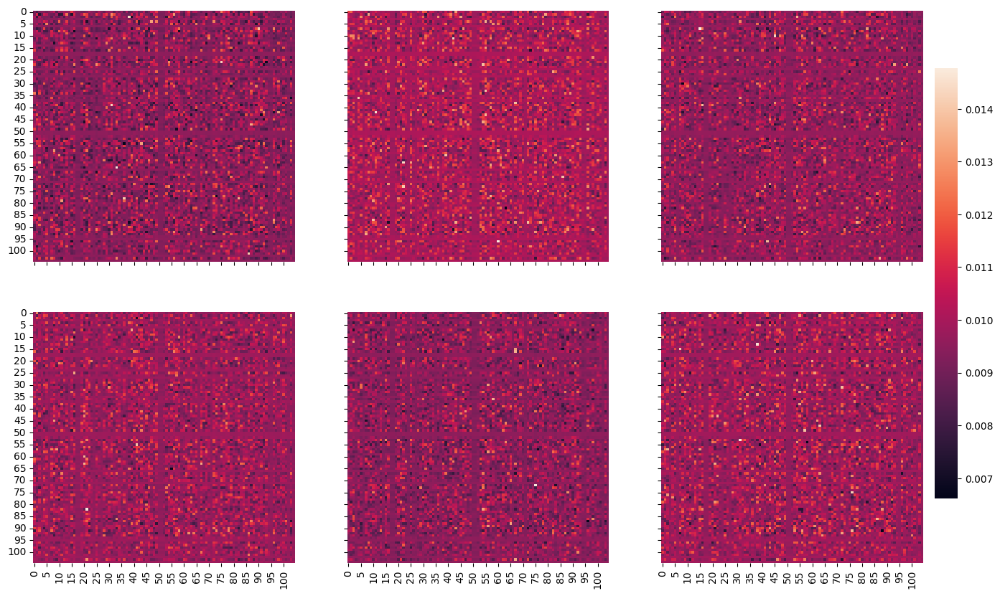

In [ ]:
fig, axn = plt.subplots(2, 3, figsize=(16, 10), sharex=True, sharey=True)
cbar_ax = fig.add_axes([.91, .2, .02, .6])

for i, ax in enumerate(axn.flat):
    sns.heatmap(a_s[i-1].numpy(), ax=ax,
                cbar=i == 0,
                cbar_ax=None if i else cbar_ax)

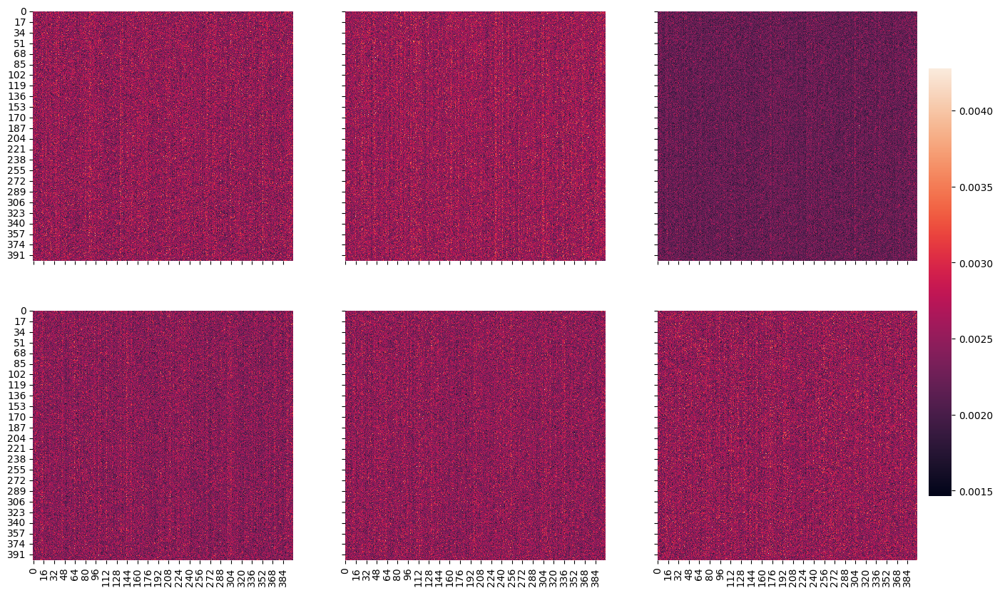

In [ ]:
fig, axn = plt.subplots(2, 3, figsize=(16, 10), sharex=True, sharey=True)
cbar_ax = fig.add_axes([.91, .2, .02, .6])

for i, ax in enumerate(axn.flat):
    sns.heatmap(a_t[i-1].numpy(), ax=ax,
                cbar=i == 0,
                cbar_ax=None if i else cbar_ax)

### Training and experiments

In [ ]:
bs = 8
n_epochs = 30
lr = 0.00002 # 0.001
dropout = 0.3

In [ ]:
configuration = "b="+str(bs)+",ep="+str(n_epochs)+",lr="+str(lr)
lag = np.arange(0,500,100)
start = 500
end = 900
for idx, lag in enumerate(lag):
  range_ms = str(1000-(start-lag))+'-'+str(1000-(end-lag))
  print()
  print('Start training... for the range of ms before the moviment: ', range_ms)
  print()

  dataset = Monkeys_dataset(mat_file_labels = 'Stop_Task_Collab_2023/BHV_Go.mat', mat_file_x = 'Stop_Task_Collab_2023/activity_movement_onset_Go.mat',
                                    root_dir='Stop_Task_Collab_2023/', start_idx = start-lag, end_idx = end-lag)
  
  monkey_train, monkey_val, monkey_test = torch.utils.data.random_split(dataset, [0.7, 0.2, 0.1])
  # Loaders create mini-batches of images from the original dataset
  loader_train = torch.utils.data.DataLoader(monkey_train, batch_size=bs, shuffle=True,)
  loader_val = torch.utils.data.DataLoader(monkey_val, batch_size=bs, shuffle=False)
  loader_test = torch.utils.data.DataLoader(monkey_test, batch_size=bs, shuffle=False)
  
  logger = pylight.loggers.TensorBoardLogger(save_dir='.', version=configuration+'-'+range_ms, name='Transformer1_2D_logs')
  model = Transformer(learning_rate = lr, dropout = dropout)
  trainer = pylight.Trainer(max_epochs=n_epochs, accelerator='gpu', devices=1,default_root_dir="/content/drive/MyDrive/", logger=logger)
  trainer.fit(model, loader_train, loader_val)


Start training... for the range of ms before the moviment:  500-100



INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type               | Params
--------------------------------------------------
0 | space      | TransformerBlock   | 289 K 
1 | time       | TransformerBlock   | 4.2 M 
2 | classifier | Linear             | 212   
3 | acc        | MulticlassAccuracy | 0     
4 | dropout    | Dropout            | 0     
--------------------------------------------------
4.5 M     Trainable params
0         Non-trainable params
4.5 M     Total params
17.838    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.



Start training... for the range of ms before the moviment:  600-200



INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type               | Params
--------------------------------------------------
0 | space      | TransformerBlock   | 289 K 
1 | time       | TransformerBlock   | 4.2 M 
2 | classifier | Linear             | 212   
3 | acc        | MulticlassAccuracy | 0     
4 | dropout    | Dropout            | 0     
--------------------------------------------------
4.5 M     Trainable params
0         Non-trainable params
4.5 M     Total params
17.838    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.



Start training... for the range of ms before the moviment:  700-300



INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type               | Params
--------------------------------------------------
0 | space      | TransformerBlock   | 289 K 
1 | time       | TransformerBlock   | 4.2 M 
2 | classifier | Linear             | 212   
3 | acc        | MulticlassAccuracy | 0     
4 | dropout    | Dropout            | 0     
--------------------------------------------------
4.5 M     Trainable params
0         Non-trainable params
4.5 M     Total params
17.838    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.



Start training... for the range of ms before the moviment:  800-400



INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type               | Params
--------------------------------------------------
0 | space      | TransformerBlock   | 289 K 
1 | time       | TransformerBlock   | 4.2 M 
2 | classifier | Linear             | 212   
3 | acc        | MulticlassAccuracy | 0     
4 | dropout    | Dropout            | 0     
--------------------------------------------------
4.5 M     Trainable params
0         Non-trainable params
4.5 M     Total params
17.838    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.



Start training... for the range of ms before the moviment:  900-500



INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type               | Params
--------------------------------------------------
0 | space      | TransformerBlock   | 289 K 
1 | time       | TransformerBlock   | 4.2 M 
2 | classifier | Linear             | 212   
3 | acc        | MulticlassAccuracy | 0     
4 | dropout    | Dropout            | 0     
--------------------------------------------------
4.5 M     Trainable params
0         Non-trainable params
4.5 M     Total params
17.838    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.


In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=Transformer1_2D_logs/
# !kill 3542

<IPython.core.display.Javascript object>